In [1]:
import numpy as np
from scipy.spatial import distance_matrix
import matplotlib.pyplot as plt
from Functions import *
from gaussfft import gaussfft
from PIL import Image
from lab3 import kmeans_segm
from kmeans_example import *
from mean_shift_example import mean_shift_segm,mean_shift_example

In [2]:
def open_image(path):
    im = Image.open(path)
    im = np.array(im).astype(np.float32)
    return im

## Exercise 2 : K-means clustering

In [3]:
def kmeans_segm(image, K, L, seed = 42, early_stopping=False):
    """
    Implement a function that uses K-means to find cluster 'centers'
    and a 'segmentation' with an index per pixel indicating with 
    cluster it is associated to.

    Input arguments:
        image - the RGB input image 
        K - number of clusters
        L - number of iterations
        seed - random seed
    Output:
        segmentation: an integer image with cluster indices
        centers: an array with K cluster mean colors
    """ 
    # Set random seed
    np.random.seed(seed)

    

    # Initialize centers by sampling K different pixels from the image and using their RGB color as the center
    pixel_values = np.reshape(image, (-1, 3))
    centers = set()
    while len(centers) < K:
        center = pixel_values[np.random.choice(pixel_values.shape[0], 1, replace=False)]
        center = tuple(center[0])
        if center not in centers:
            centers.add(center)
    centers = np.array(list(centers))
    new_centers = np.zeros(centers.shape)
    
    # Check if image is 2D or 3D
    if len(image.shape) == 3:
        image_to_segm = np.reshape(image, (-1, 3))
    else:
        image_to_segm = image

    segmentation = np.zeros(image_to_segm.shape[0]*image_to_segm.shape[1]).astype(np.int32)
    # Compute all distances between pixels and cluster centers
    distances = distance_matrix(image_to_segm, centers)
    # Iterate L times
    for i in range(L):
        # Assign each pixel to the cluster center for which the distance is minimum
        new_segmentation = np.argmin(distances, axis=1)
        
        # Check if segmentation has changed
        if np.array_equal(segmentation, new_segmentation) and early_stopping:
            break
        segmentation = new_segmentation

        # Recompute each cluster center by taking the mean of all pixels assigned to it
        for j in range(K):
            centers[j] = np.mean(image_to_segm[segmentation == j], axis=0)
        
        # Recompute all distances between pixels and cluster centers
        distances = distance_matrix(image_to_segm, centers)
    num_iterations = i + 1 
    segmentation = np.reshape(segmentation, image.shape[:2])

    return segmentation, centers, num_iterations

In [4]:
def image_from_segmentation(segmentation, centers):
    """
    Creates an image from a segmentation and cluster centers.
    """ 
    # get image dimensions
    height, width = segmentation.shape

    # create image from segmentation and centers
    image = np.zeros((height, width, 3))
    for i in range(height):
        for j in range(width):
            image[i, j] = centers[segmentation[i, j]]

    return image

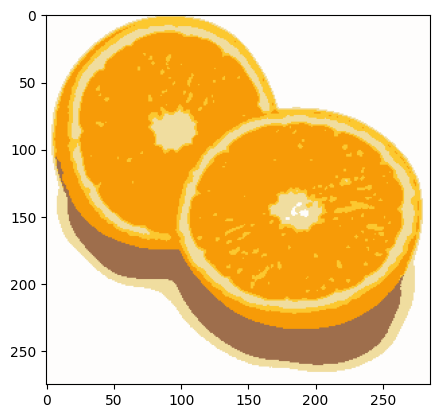

Number of iterations before convergence:  24


In [5]:
#potrebbe essere incluso in una funzione 
scale_factor = 0.5
image_sigma = 1.0
img = Image.open('Images-jpg/orange.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
h = ImageFilter.GaussianBlur(image_sigma)
I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)


segmentation, centers,num_iterations = kmeans_segm(image=I, K = 5, L=50,early_stopping=True) 
result = image_from_segmentation(segmentation, centers)
result_bytes = np.uint8(result)
plt.imshow(result_bytes)
plt.show()
print('Number of iterations before convergence: ', num_iterations)


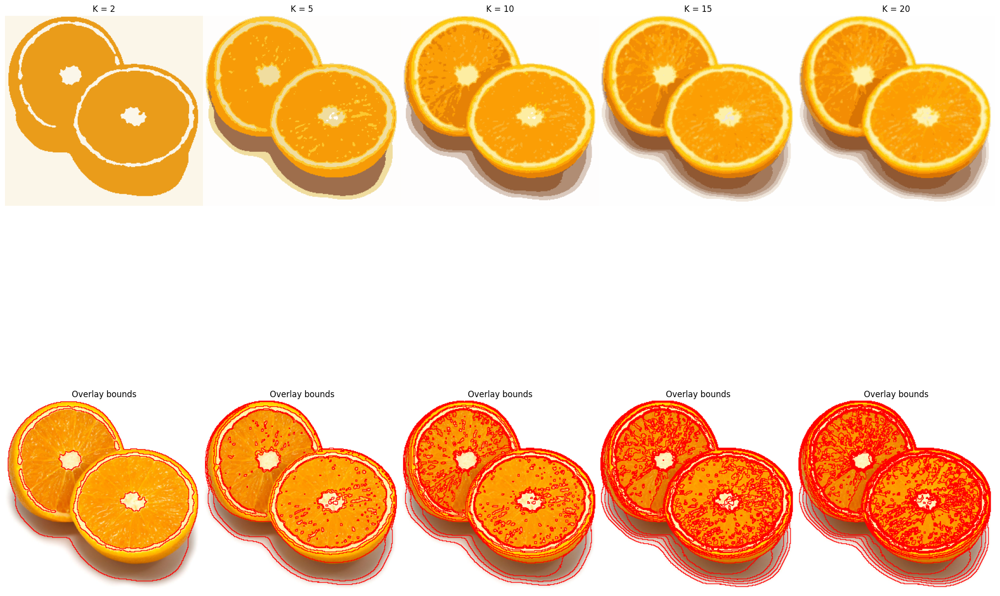

Text(0.5, 1.0, 'Number of iterations before convergence for different values of K')

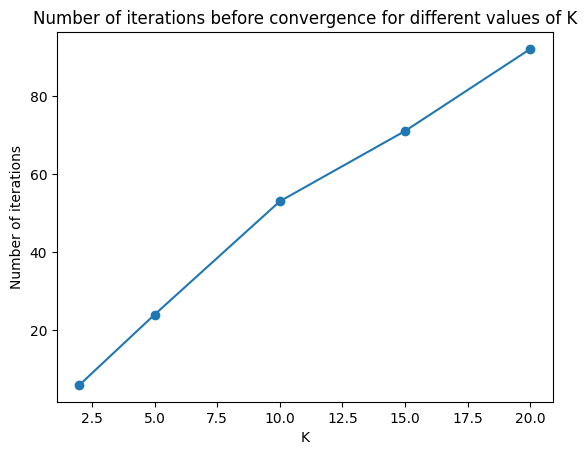

In [6]:
# Testing different values of K
scale_factor = 0.5
image_sigma=1.0
K_s = [2, 5, 10, 15, 20]
convergence_times =[]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i, K in enumerate(K_s):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers, conv_time = kmeans_segm(image=img, K = K, L=100, early_stopping=True)
    convergence_times.append(conv_time)
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'K = {K}')
    img= Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout(pad=0)
plt.show()

plt.plot(K_s, convergence_times, 'o-')
plt.xlabel('K')
plt.ylabel('Number of iterations')
plt.title('Number of iterations before convergence for different values of K')


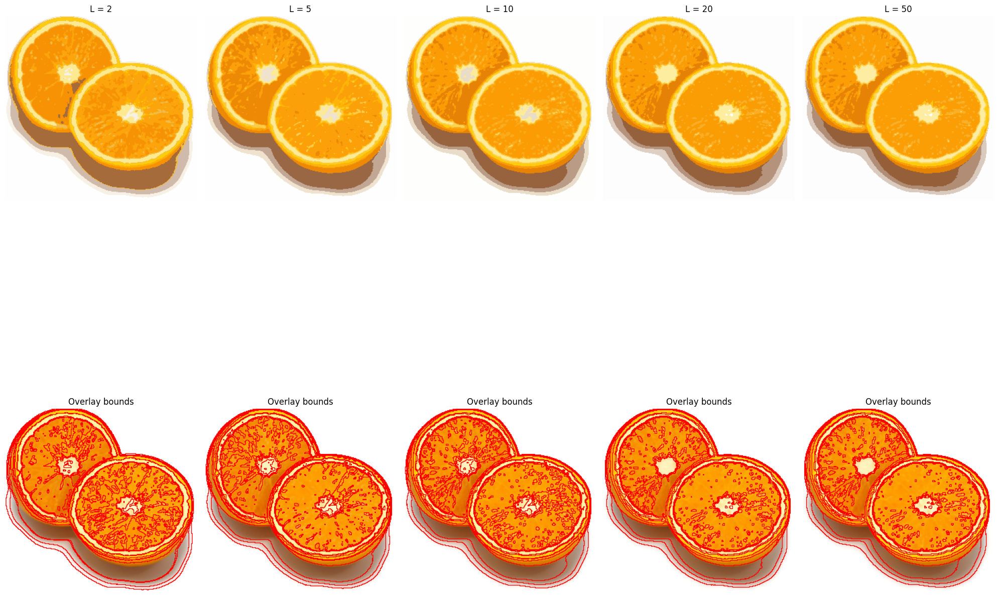

In [7]:
# Testing different values of L
scale_factor = 0.5
image_sigma=1.0
L_s = [2, 5, 10, 20, 50]
fig, axs = plt.subplots(2, len(L_s), figsize=(20, 20))
for i, l in enumerate(L_s):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 10, L=l) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'L = {l}')
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

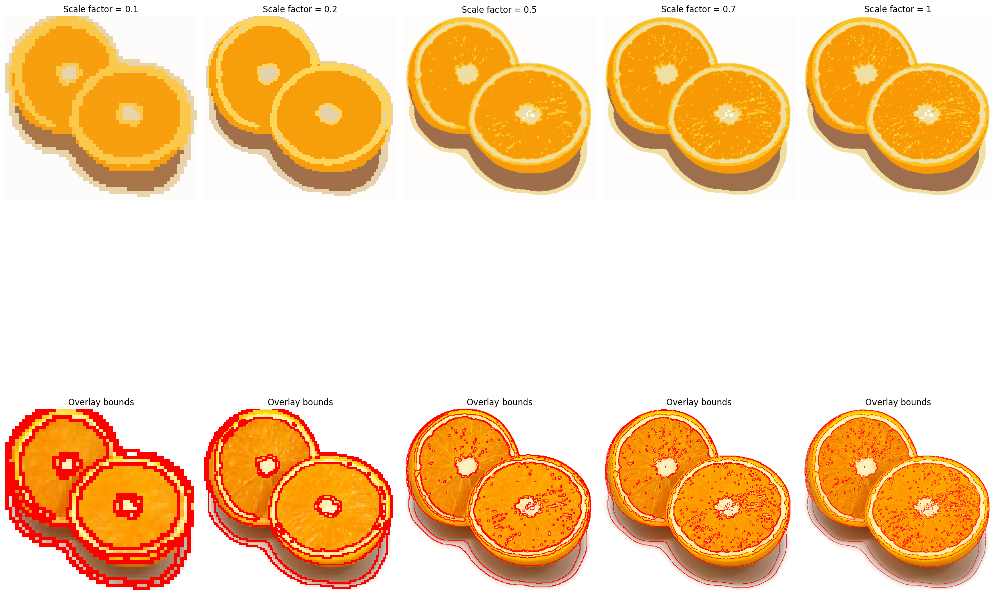

In [8]:
# Testing different values of scale factor
image_sigma=1.0
scale_factors = [0.1,0.2, 0.5, 0.7, 1]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
for i, scale_factor in enumerate(scale_factors):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 5, L=30) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Scale factor = {scale_factor}')
    img= Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

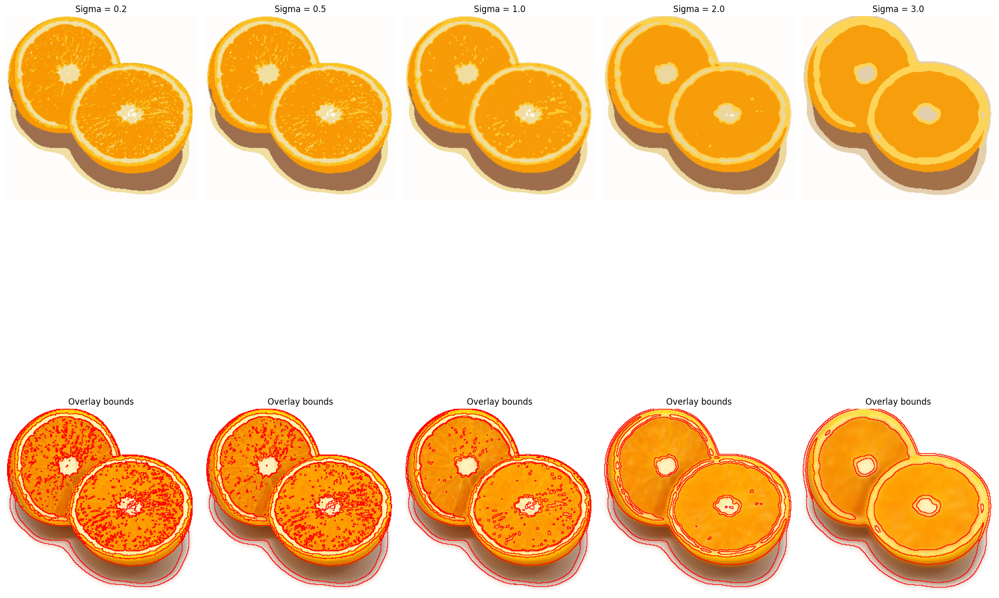

In [9]:
# Testing different values of sigma
scale_factor = 0.5
sigma_s = [0.2,0.5, 1.0, 2.0, 3.0]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
for i, sigma in enumerate(sigma_s):
    
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img.filter(ImageFilter.GaussianBlur(sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 5, L=30) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Sigma = {sigma}')
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

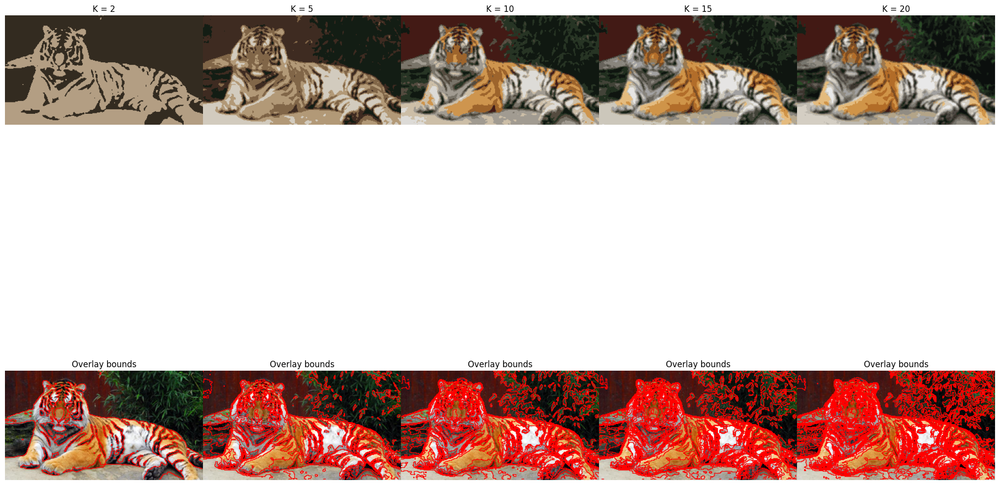

Text(0.5, 1.0, 'Number of iterations before convergence for different values of K')

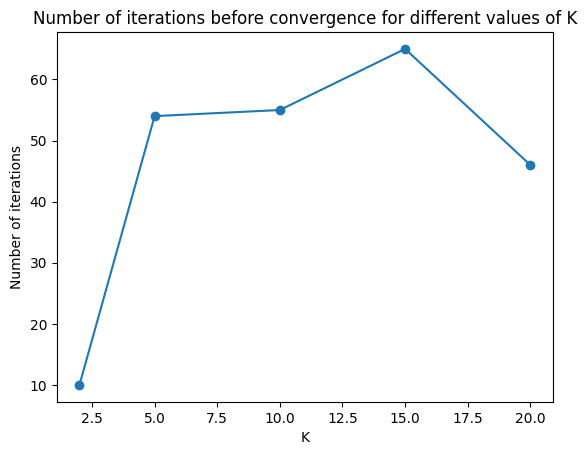

In [10]:
scale_factor = 0.5
image_sigma=1.0
K_s = [2, 5, 10, 15, 20]
convergence_times =[]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i, K in enumerate(K_s):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers, conv_time = kmeans_segm(image=img, K = K, L=100, early_stopping=True)
    convergence_times.append(conv_time)
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'K = {K}')
    img= Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout(pad=0)
plt.show()

plt.plot(K_s, convergence_times, 'o-')
plt.xlabel('K')
plt.ylabel('Number of iterations')
plt.title('Number of iterations before convergence for different values of K')

## Exercise 3 : Mean-shift segmentation

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


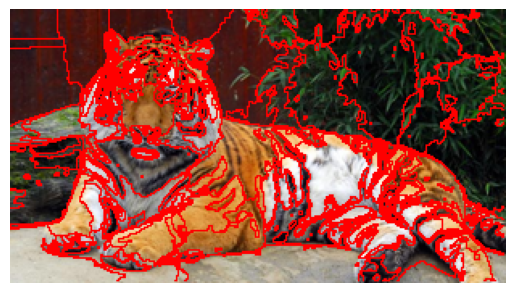

In [11]:
mean_shift_example()

### Question 5

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


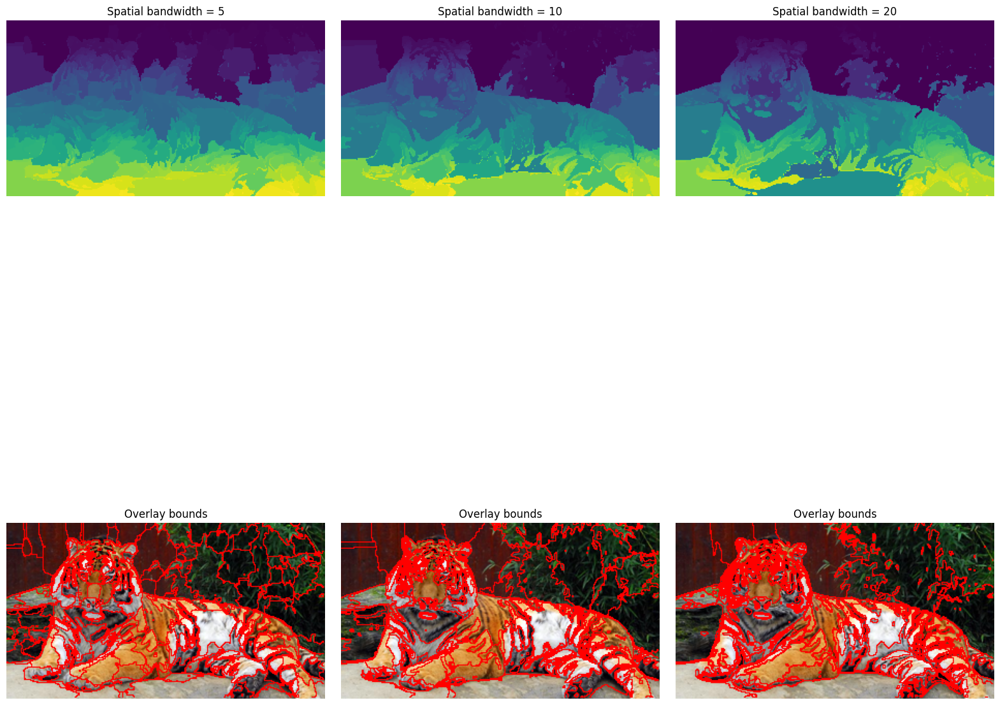

In [12]:
spatial_bandwidths = [5, 10, 20]
num_iterations = 40
scale_factor = 0.5         # image downscale factor
image_sigma = 1.0          # image preblurring scale
colour_bandwidth = 20.0    # colour bandwidth
num_iterations = 40        # number of mean-shift iterations

fig, axs = plt.subplots(2, len(spatial_bandwidths), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i,spatial_bw in enumerate(spatial_bandwidths):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segm = mean_shift_segm(I, spatial_bw, colour_bandwidth, num_iterations)
    axs[0,i].imshow(segm)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Spatial bandwidth = {spatial_bw}')
    axs[1,i].imshow(overlay_bounds(img, segm))
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
plt.show()

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


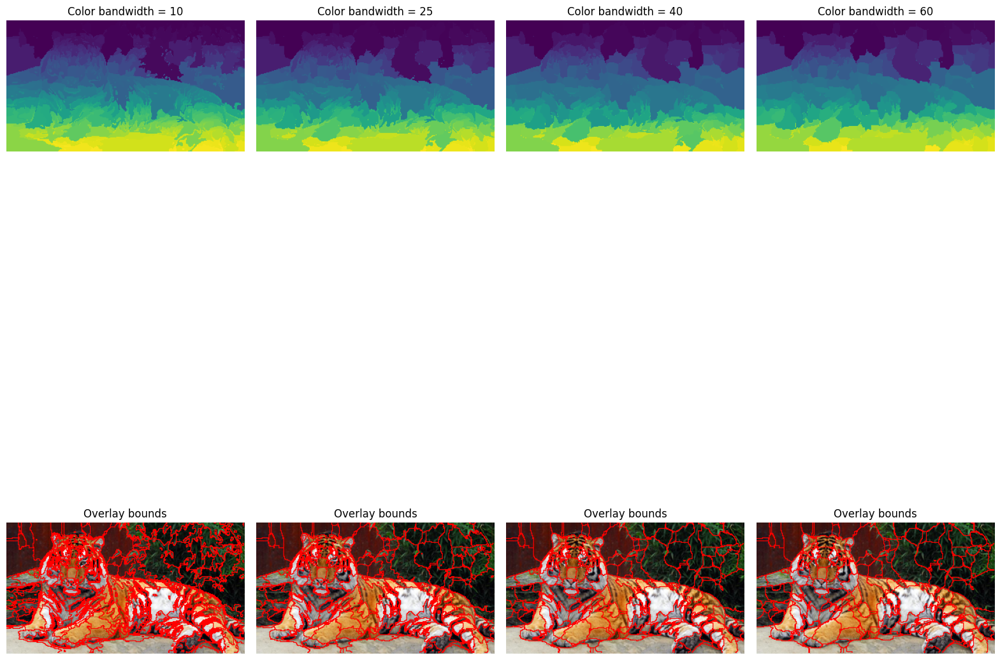

In [13]:
color_bandwidths = [10, 25, 40, 60]
spatial_bandwidth = 5
num_iterations = 40
scale_factor = 0.5         # image downscale factor
image_sigma = 1.0          # image preblurring scale
num_iterations = 40        # number of mean-shift iterations

fig, axs = plt.subplots(2, len(color_bandwidths), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i,color_bw in enumerate(color_bandwidths):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segm = mean_shift_segm(I, spatial_bandwidth, color_bw, num_iterations)
    axs[0,i].imshow(segm)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Color bandwidth = {color_bw}')
    axs[1,i].imshow(overlay_bounds(img, segm))
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
plt.show()

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


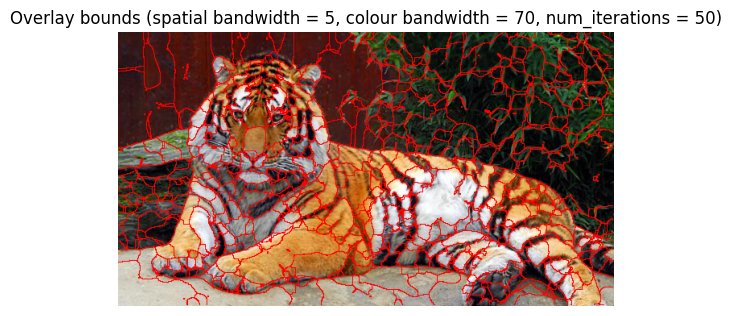

In [14]:
image_sigma=1.0
spatial_bw = 5
color_bw = 70
num_iterations = 50
img = Image.open('Images-jpg/tiger1.jpg')
I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
segm = mean_shift_segm(I=I, spatial_bandwidth=5, colour_bandwidth=70, num_iterations=50)
plt.imshow(overlay_bounds(img, segm))
plt.axis('off')
plt.title('Overlay bounds (spatial bandwidth = {}, colour bandwidth = {}, num_iterations = {})'.format(spatial_bw, color_bw, num_iterations))
plt.show()

### Question 6

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


Text(0.5, 1.0, 'K-Means')

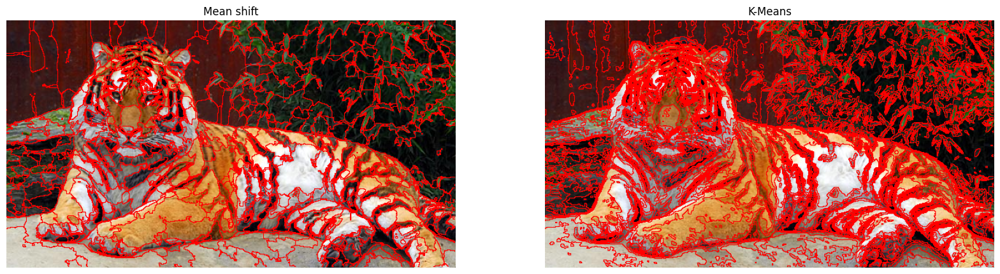

In [15]:
image_sigma = 1.0
spatial_bandwidth = 5
color_bw = 20
num_iterations = 40
K=15

fig,axs = plt.subplots(1,2, figsize=(20, 10))
original_img = Image.open('Images-jpg/tiger1.jpg')
I = np.asarray(original_img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
segm_mean_shift = mean_shift_segm(I, spatial_bandwidth, color_bw, num_iterations)
axs[0].imshow(overlay_bounds(original_img, segm_mean_shift))
axs[0].axis('off')
axs[0].set_title('Mean shift')

segm_kmeans,_,_ = kmeans_segm(I, K=K, L=num_iterations)
Inew = mean_segments(original_img, segm_kmeans)
Inew = overlay_bounds(original_img, segm_kmeans)
image = Image.fromarray(Inew.astype(np.ubyte))
axs[1].imshow(image)
axs[1].axis('off')
axs[1].set_title('K-Means')

## Exercise 4 : Normalized cut

## Exercise 5 : Segmentation using graph cuts 